In [ ]:
import requests
import pandas as pd
from google.colab import drive
import os
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo

In [ ]:
!pip install pandas_profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 70.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 91.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=fb1b212a5a0ae1bae0141d6532e797cd8523b4ba351720

In [ ]:
import ydata_profiling

In [ ]:
!pip install missingno

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install chart_studio.plotly as py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement chart_studio.plotly (from versions: none)
ERROR: No matching distribution found for chart_studio.plotly


In [ ]:
!pip install chart_studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 2.6 MB/s eta 0:00:00


In [ ]:
import missingno as msno
%matplotlib inline

**Carga** **Dataset**

In [ ]:
%cd '/content/gdrive/MyDrive'
df= pd.read_csv('/content/gdrive/MyDrive/Desafio entregable Clase 12. Ciucci, Dorlass, Peralta/Fuel production vs consumption.csv', encoding="latin-1")
print (df)

/content/gdrive/MyDrive
      Year       Entity  Gas production(m³)  Gas consumption(m³)  \
0     1980  Afghanistan        1.699000e+09           56640000.0   
1     1981  Afghanistan        2.237000e+09           84960000.0   
2     1982  Afghanistan        2.294000e+09          141600000.0   
3     1983  Afghanistan        2.407000e+09          141600000.0   
4     1984  Afghanistan        2.407000e+09          141600000.0   
...    ...          ...                 ...                  ...   
9232  2017     Zimbabwe        0.000000e+00                  0.0   
9233  2018     Zimbabwe        0.000000e+00                  0.0   
9234  2019     Zimbabwe        0.000000e+00                  0.0   
9235  2020     Zimbabwe        0.000000e+00                  0.0   
9236  2021     Zimbabwe                 NaN                  NaN   

      Coal production(Ton)  Coal consumption(Ton)  Oil production(m³)  \
0                 119000.0               119000.0                 0.0   
1            

**Dimensiones del dataset**

In [ ]:
df.shape

(9237, 15)

**Conteo de Valores por columna**

In [ ]:
df.count

<bound method DataFrame.count of       Year       Entity  Gas production(m³)  Gas consumption(m³)  \
0     1980  Afghanistan        1.699000e+09           56640000.0   
1     1981  Afghanistan        2.237000e+09           84960000.0   
2     1982  Afghanistan        2.294000e+09          141600000.0   
3     1983  Afghanistan        2.407000e+09          141600000.0   
4     1984  Afghanistan        2.407000e+09          141600000.0   
...    ...          ...                 ...                  ...   
9232  2017     Zimbabwe        0.000000e+00                  0.0   
9233  2018     Zimbabwe        0.000000e+00                  0.0   
9234  2019     Zimbabwe        0.000000e+00                  0.0   
9235  2020     Zimbabwe        0.000000e+00                  0.0   
9236  2021     Zimbabwe                 NaN                  NaN   

      Coal production(Ton)  Coal consumption(Ton)  Oil production(m³)  \
0                 119000.0               119000.0                 0.0   
1   

**Tipos de datos por columna**

In [ ]:
df.dtypes

Year                                  int64
Entity                               object
Gas production(m³)                  float64
Gas consumption(m³)                 float64
Coal production(Ton)                float64
Coal consumption(Ton)               float64
Oil production(m³)                  float64
Oil consumption(m³)                 float64
Gas production per capita(m³)       float64
Gas consumption per capita(m³)      float64
Coal production per capita(Ton)     float64
Coal consumption per capita(Ton)    float64
Oil production per capita(m³)       float64
Oil consumption per capita(m³)      float64
Population                          float64
dtype: object

**Estructura del dataset**

In [ ]:
type(df)

pandas.core.frame.DataFrame

**Principales medidas**

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,9237.0,2.000443e+03,1.243928e+01,1973.0,1.990000e+03,2.001000e+03,2.011000e+03,2.021000e+03
Gas production(m³),8708.0,2.383023e+10,1.896640e+11,0.0,0.000000e+00,0.000000e+00,1.614000e+09,4.039000e+12
Gas consumption(m³),8689.0,2.392419e+10,1.891608e+11,0.0,0.000000e+00,0.000000e+00,3.981000e+09,4.004000e+12
Coal production(Ton),8817.0,5.261801e+07,4.355659e+08,0.0,0.000000e+00,0.000000e+00,1.720000e+05,8.144000e+09
Coal consumption(Ton),8817.0,5.215915e+07,4.349869e+08,0.0,0.000000e+00,1.221000e+03,2.001000e+06,8.179000e+09
Oil production(m³),8792.0,4.141132e+07,2.901607e+08,0.0,0.000000e+00,0.000000e+00,3.194000e+06,4.817000e+09
Oil consumption(m³),8555.0,4.550758e+07,3.268641e+08,0.0,3.233000e+05,1.568000e+06,1.207000e+07,5.820000e+09
Gas production per capita(m³),7689.0,9.635696e+02,4.554542e+03,0.0,0.000000e+00,0.000000e+00,1.121000e+02,7.152000e+04
Gas consumption per capita(m³),7671.0,6.126219e+02,2.008360e+03,0.0,0.000000e+00,1.406000e+00,4.505000e+02,2.716000e+04
Coal production per capita(Ton),7757.0,4.241890e-01,1.577120e+00,0.0,0.000000e+00,0.000000e+00,2.211000e-02,2.177000e+01


**Renombramos columnas para que el dataset sea mas sencillo de manipular**


In [ ]:
df = df.rename(columns={'Gas production(m³)': 'gasproduction', 'Gas consumption(m³)': 'gasconsumption'})

**Comenzamos el análisis de datos nulos y su respectivo reemplazo por cero**

In [ ]:
print(df.isnull().values.any())

True


**Conteo de valores nulos por columna**

In [ ]:
nulos = df.isnull().sum()

In [ ]:
print(nulos)

Year                                   0
Entity                                 0
gasproduction                        529
gasconsumption                       548
Coal production(Ton)                 420
Coal consumption(Ton)                420
Oil production(m³)                   445
Oil consumption(m³)                  682
Gas production per capita(m³)       1548
Gas consumption per capita(m³)      1566
Coal production per capita(Ton)     1480
Coal consumption per capita(Ton)    1480
Oil production per capita(m³)       1417
Oil consumption per capita(m³)      1636
Population                          1105
dtype: int64


**Generamos un gráfico de barras para visualizar los datos nulos**

In [ ]:
fig = go.Figure(
    go.Bar(
        x=nulos.values,
        y=nulos.index,
        orientation='h',
        text=nulos.values,
        textposition='inside'
    )
)

In [ ]:
fig.update_layout(
    title='Valores nulos por columna',
    xaxis_title='Cantidad de valores nulos',
    yaxis_title='Columnas',
    height=800,
)

fig.show()

**Se buscan si hay datos duplicados**

In [ ]:
duplicados = df.duplicated()
df_duplicados = df[duplicados]
print(df_duplicados)

Empty DataFrame
Columns: [Year, Entity, gasproduction, gasconsumption, Coal production(Ton), Coal consumption(Ton), Oil production(m³), Oil consumption(m³), Gas production per capita(m³), Gas consumption per capita(m³), Coal production per capita(Ton), Coal consumption per capita(Ton), Oil production per capita(m³), Oil consumption per capita(m³), Population]
Index: []


**Eliminamos los datos nulos**

In [ ]:
df.dropna(inplace=True)

**Comprobamos que no queden datos nulos**

In [ ]:
print(df.isnull().values.any())

False


**Realizamos el Data Profiling**

In [ ]:
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Realizamos un heatmap de correlación que nos permite observar las correlaciones existentes entre variables numéricas**

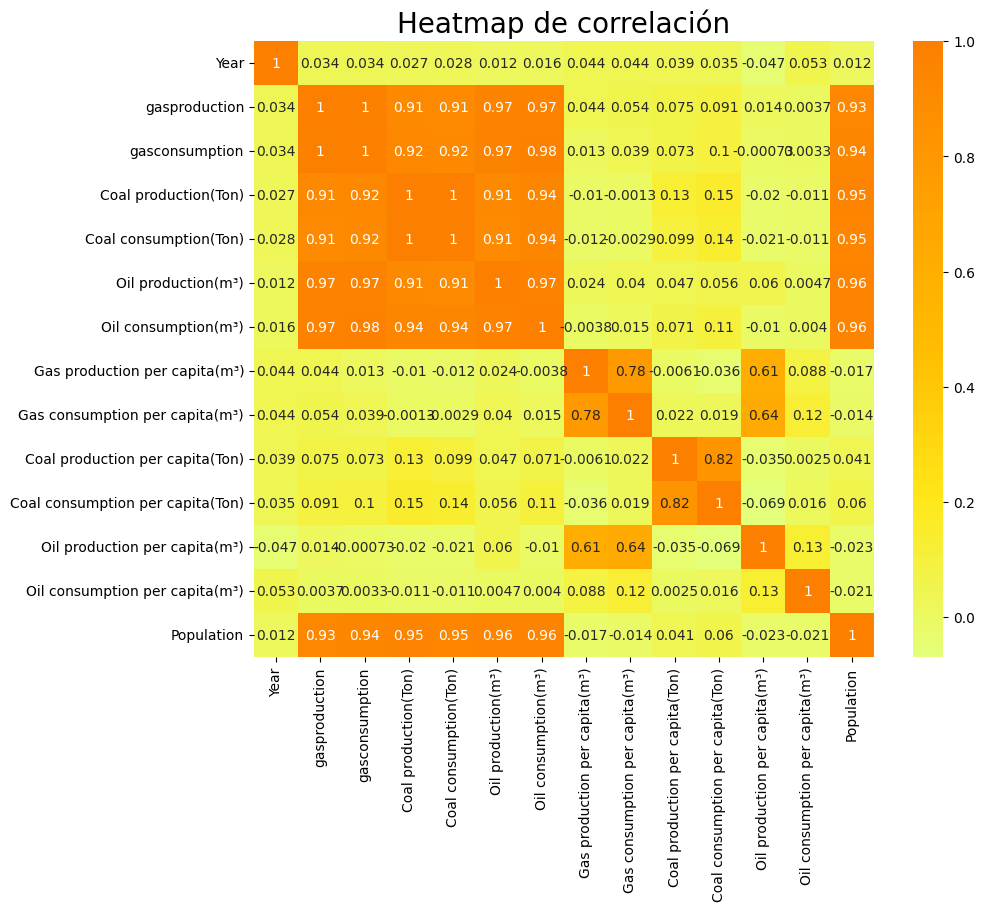

In [ ]:
numeric_cols = df.loc[:, df.dtypes != object]
plt.rcParams['figure.figsize'] = (10, 8)
sns.heatmap(numeric_cols.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap de correlación', fontsize = 20)
plt.show()

**Con gráficos lineales mostramos la información de las columnas relevantes**

**Se filtran todos los registros que sean igual a 'World'**

In [ ]:
df_mundo = df[df['Entity'] == 'World']

**Se filtran para observar las últimas 6 filas**

In [ ]:
df_mundo.tail(6) 

,Year,Entity,gasproduction,gasconsumption,Coal production(Ton),Coal consumption(Ton),Oil production(m³),Oil consumption(m³),Gas production per capita(m³),Gas consumption per capita(m³),Coal production per capita(Ton),Coal consumption per capita(Ton),Oil production per capita(m³),Oil consumption per capita(m³),Population
9104,2014,World,3.493000e+12,3.494000e+12,8.046000e+09,8.076000e+09,4.555000e+09,5.422000e+09,478.9,479.0,1.1030,1.1070,0.6245,0.7434,7.294000e+09
9105,2015,World,3.553000e+12,3.543000e+12,7.864000e+09,7.822000e+09,4.692000e+09,5.526000e+09,481.5,480.1,1.0660,1.0600,0.6359,0.7489,7.378000e+09
9106,2016,World,3.590000e+12,3.620000e+12,7.390000e+09,7.616000e+09,4.696000e+09,5.608000e+09,481.0,485.1,0.9903,1.0210,0.6292,0.7515,7.463000e+09
9107,2017,World,3.703000e+12,3.736000e+12,7.604000e+09,7.691000e+09,4.716000e+09,5.731000e+09,490.6,495.0,1.0080,1.0190,0.6249,0.7594,7.547000e+09
9108,2018,World,3.906000e+12,3.923000e+12,7.903000e+09,7.800000e+09,4.817000e+09,5.789000e+09,512.4,514.6,1.0370,1.0230,0.6319,0.7595,7.623000e+09
9109,2019,World,4.039000e+12,4.004000e+12,8.025000e+09,7.681000e+09,4.771000e+09,5.820000e+09,524.2,519.7,1.0420,0.9968,0.6193,0.7554,7.705000e+09


**Se realizan los gráficos de lineas**

In [ ]:
from plotly.subplots import make_subplots

In [ ]:
fig = make_subplots(rows=3, cols=1, shared_xaxes=True,
                    subplot_titles=("Consumption", "Production", "Consumption per Capita vs Population"))

fig.add_trace(go.Scatter(x=df_mundo['Year'], y=df_mundo['gasconsumption'], name="Consumption", line=dict(color='red')), row=1, col=1)
fig.add_trace(go.Scatter(x=df_mundo['Year'], y=df_mundo['gasproduction'], name="Production", line=dict(color='green')), row=2, col=1)
fig.add_trace(go.Scatter(x=df_mundo['Year'], y=df_mundo['Population'], name="Population", line=dict(color='yellow')), row=3, col=1)

fig.update_xaxes(title_text="Year")

fig.update_yaxes(title_text="Gas consumption (m³)", row=1, col=1)
fig.update_yaxes(title_text="Gas production (m³)", row=2, col=1)
fig.update_yaxes(title_text="Gas consumption per capita (m³)", row=3, col=1)

fig.update_layout(title_text="Gas Production and Consumption", height=800)

fig.show()